In [1]:
import sys
import stlearn as st
st.settings.set_figure_params(dpi=300)
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import sys
file = Path("../stimage").resolve()
parent= file.parent
sys.path.append(str(parent))
from PIL import Image
from stimage._utils import gene_plot, Read10X, ReadOldST, tiling
from stimage._model import CNN_NB_multiple_genes, negative_binomial_layer, negative_binomial_loss
from stimage._data_generator import DataGenerator, DataGenerator_LSTM_one_output
import tensorflow as tf
import seaborn as sns
sns.set_style("white")
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np
# import geopandas as gpd
from sklearn.neighbors import KDTree
from anndata import read_h5ad
from tensorflow.keras import backend as K

In [2]:
from scipy import stats

def plot_correlation(df, attr_1, attr_2):
    r = stats.pearsonr(df[attr_1], 
                       df[attr_2])[0] **2

    g = sns.lmplot(data=df,
        x=attr_1, y=attr_2,
        height=5, legend=True
    )
    # g.set(ylim=(0, 360), xlim=(0,360))

    g.set_axis_labels(attr_1, attr_2)
    plt.annotate(r'$R^2:{0:.2f}$'.format(r),
                (max(df[attr_1])*0.9, max(df[attr_2])*0.9))
    return g


def calculate_correlation(attr_1, attr_2):
    r = stats.pearsonr(attr_1, 
                       attr_2)[0]
    return r

def calculate_correlation_2(attr_1, attr_2):
    r = stats.spearmanr(attr_1, 
                       attr_2)[0]
    return r

In [67]:

DATA_PATH = Path("/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_project/STimage_dataset/breast_cancer_10x_visium/dataset_3_299_no_norm")


In [31]:
DATA_PATH = Path("/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_project/STimage_dataset/breast_cancer_10x_visium/dataset_3_299")

In [68]:
adata_all = read_h5ad(DATA_PATH / "all_adata.h5ad")

In [69]:
adata_all.obs["tile_path"] = adata_all.obs.tile_path.map(lambda x:x.replace("/clusterdata/uqxtan9/Xiao/Q1851/Xiao/",
                                               "/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_project/"))

In [34]:
adata_all.obs

,in_tissue,array_row,array_col,sum_counts,imagecol,imagerow,tile_tissue_mask_path,tissue_area,tile_path,library_id
AAACAAGTATCTCCCA-1-block1,1,50,102,12072.0,17428,15937,/tmp/block1_tissue_mask/block1-17428-15937-299...,0.864789,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,block1
AAACACCAATAACTGC-1-block1,1,59,19,54083.0,6092,18054,/tmp/block1_tissue_mask/block1-6092-18054-299....,0.901019,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,block1
AAACAGAGCGACTCCT-1-block1,1,14,94,4237.0,16351,7383,/tmp/block1_tissue_mask/block1-16351-7383-299....,0.707453,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,block1
AAACAGGGTCTATATT-1-block1,1,47,13,22649.0,5278,15202,/tmp/block1_tissue_mask/block1-5278-15202-299....,0.901567,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,block1
AAACAGTGTTCCTGGG-1-block1,1,73,43,51367.0,9363,21386,/tmp/block1_tissue_mask/block1-9363-21386-299....,0.835595,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,block1
...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1-FFPE,1,24,64,8648.0,14428,9698,/tmp/FFPE_tissue_mask/FFPE-14428-9698-299.jpeg,0.967226,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,FFPE
TTGTTGTGTGTCAAGA-1-FFPE,1,31,77,13509.0,16312,11467,/tmp/FFPE_tissue_mask/FFPE-16312-11467-299.jpeg,0.977070,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,FFPE
TTGTTTCACATCCAGG-1-FFPE,1,58,42,2994.0,11229,18277,/tmp/FFPE_tissue_mask/FFPE-11229-18277-299.jpeg,0.766479,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,FFPE
TTGTTTCATTAGTCTA-1-FFPE,1,60,30,8074.0,9488,18780,/tmp/FFPE_tissue_mask/FFPE-9488-18780-299.jpeg,0.973043,/clusterdata/uqxtan9/Xiao/Q1851/Xiao/Working_p...,FFPE


In [70]:
gene_list=["SLITRK6", "PGM5", 
           "TTLL12", "COX6C", "CPB1",
           "KRT5", "CD74"]
gene_list

['SLITRK6', 'PGM5', 'TTLL12', 'COX6C', 'CPB1', 'KRT5', 'CD74']

In [71]:
gene_list=["COX6C","TTLL12", "PABPC1", "GNAS", "HSP90AB1", 
           "TFF3", "ATP1A1", "B2M", "FASN", "SPARC", "CD74", "CD63", "CD24", "CD81"]

In [72]:
n_genes = len(gene_list)
training_index = adata_all.obs.library_id == "block1"
training_dataset = adata_all[training_index,].copy()

valid_index = adata_all.obs.library_id == "block2"
valid_dataset = adata_all[valid_index,].copy()

test_index = adata_all.obs.library_id == "FFPE"
test_dataset = adata_all[test_index,].copy()

In [73]:
train_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=training_dataset, 
                          genes=gene_list, aug=False),
            output_types=(tf.float32, tuple([tf.float32]*n_genes)), 
            output_shapes=([299,299,3], tuple([1]*n_genes))
)
train_gen_ = train_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
valid_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=valid_dataset, 
                          genes=gene_list), 
            output_types=(tf.float32, tuple([tf.float32]*n_genes)), 
            output_shapes=([299,299,3], tuple([1]*n_genes))
)
valid_gen_ = valid_gen.shuffle(buffer_size=500).batch(128).repeat(3).cache().prefetch(tf.data.experimental.AUTOTUNE)
test_gen = tf.data.Dataset.from_generator(
            lambda:DataGenerator(adata=test_dataset, 
                          genes=gene_list), 
            output_types=(tf.float32, tuple([tf.float32]*n_genes)), 
            output_shapes=([299,299,3], tuple([1]*n_genes))
)
test_gen_ = test_gen.batch(1)

In [74]:
K.clear_session()
model = CNN_NB_multiple_genes((299, 299, 3), n_genes)
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20,
                                            restore_best_weights=False)

In [63]:
train_history = model.fit(train_gen_,
                          epochs=50,
                          validation_data=valid_gen_,
                          callbacks=[callback]
                          )

Epoch 1/50
84/84 [==============================] - 47s 493ms/step - loss: 47.2273 - gene_0_loss: 3.4565 - gene_1_loss: 1.8257 - gene_2_loss: 3.0686 - gene_3_loss: 4.4606 - gene_4_loss: 4.5066 - gene_5_loss: 2.4479 - gene_6_loss: 1.9206 - gene_7_loss: 4.3619 - gene_8_loss: 4.4893 - gene_9_loss: 2.9436 - gene_10_loss: 5.2613 - gene_11_loss: 2.3908 - gene_12_loss: 3.2621 - gene_13_loss: 2.8316 - val_loss: 40.4745 - val_gene_0_loss: 2.9240 - val_gene_1_loss: 1.6693 - val_gene_2_loss: 2.5548 - val_gene_3_loss: 3.3621 - val_gene_4_loss: 3.9408 - val_gene_5_loss: 2.4207 - val_gene_6_loss: 1.8329 - val_gene_7_loss: 3.6936 - val_gene_8_loss: 3.5310 - val_gene_9_loss: 2.6057 - val_gene_10_loss: 4.2721 - val_gene_11_loss: 2.2705 - val_gene_12_loss: 2.8303 - val_gene_13_loss: 2.5668
Epoch 2/50
84/84 [==============================] - 40s 476ms/step - loss: 40.2128 - gene_0_loss: 3.0443 - gene_1_loss: 1.7503 - gene_2_loss: 2.5540 - gene_3_loss: 3.6064 - gene_4_loss: 3.5830 - gene_5_loss: 2.2480 - 

84/84 [==============================] - 40s 474ms/step - loss: 28.5003 - gene_0_loss: 2.4810 - gene_1_loss: 1.4088 - gene_2_loss: 2.0198 - gene_3_loss: 1.9759 - gene_4_loss: 2.1428 - gene_5_loss: 1.9991 - gene_6_loss: 1.2877 - gene_7_loss: 2.6276 - gene_8_loss: 2.1451 - gene_9_loss: 2.0363 - gene_10_loss: 2.4192 - gene_11_loss: 1.8822 - gene_12_loss: 2.1700 - gene_13_loss: 1.9047 - val_loss: 28.1709 - val_gene_0_loss: 2.5398 - val_gene_1_loss: 1.3433 - val_gene_2_loss: 2.0058 - val_gene_3_loss: 1.9401 - val_gene_4_loss: 2.1319 - val_gene_5_loss: 2.0415 - val_gene_6_loss: 1.2980 - val_gene_7_loss: 2.5618 - val_gene_8_loss: 2.0618 - val_gene_9_loss: 1.9475 - val_gene_10_loss: 2.4048 - val_gene_11_loss: 1.8620 - val_gene_12_loss: 2.1257 - val_gene_13_loss: 1.9067
Epoch 12/50
84/84 [==============================] - 40s 477ms/step - loss: 28.1709 - gene_0_loss: 2.4526 - gene_1_loss: 1.3922 - gene_2_loss: 2.0021 - gene_3_loss: 1.9552 - gene_4_loss: 2.1292 - gene_5_loss: 1.9822 - gene_6_los

84/84 [==============================] - 40s 477ms/step - loss: 26.1317 - gene_0_loss: 2.2923 - gene_1_loss: 1.3087 - gene_2_loss: 1.8839 - gene_3_loss: 1.8304 - gene_4_loss: 2.0288 - gene_5_loss: 1.8748 - gene_6_loss: 1.2220 - gene_7_loss: 2.2709 - gene_8_loss: 1.9192 - gene_9_loss: 1.8317 - gene_10_loss: 2.2241 - gene_11_loss: 1.7496 - gene_12_loss: 1.9131 - gene_13_loss: 1.7822 - val_loss: 26.0973 - val_gene_0_loss: 2.3619 - val_gene_1_loss: 1.2581 - val_gene_2_loss: 1.8998 - val_gene_3_loss: 1.8310 - val_gene_4_loss: 2.0295 - val_gene_5_loss: 1.9130 - val_gene_6_loss: 1.2373 - val_gene_7_loss: 2.2611 - val_gene_8_loss: 1.8891 - val_gene_9_loss: 1.7829 - val_gene_10_loss: 2.2108 - val_gene_11_loss: 1.7501 - val_gene_12_loss: 1.8848 - val_gene_13_loss: 1.7880
Epoch 22/50
84/84 [==============================] - 40s 476ms/step - loss: 25.9807 - gene_0_loss: 2.2799 - gene_1_loss: 1.3034 - gene_2_loss: 1.8743 - gene_3_loss: 1.8216 - gene_4_loss: 2.0199 - gene_5_loss: 1.8664 - gene_6_los

84/84 [==============================] - 40s 476ms/step - loss: 24.9663 - gene_0_loss: 2.1898 - gene_1_loss: 1.2702 - gene_2_loss: 1.8054 - gene_3_loss: 1.7637 - gene_4_loss: 1.9528 - gene_5_loss: 1.8086 - gene_6_loss: 1.1898 - gene_7_loss: 2.1218 - gene_8_loss: 1.8118 - gene_9_loss: 1.7450 - gene_10_loss: 2.1005 - gene_11_loss: 1.6874 - gene_12_loss: 1.8048 - gene_13_loss: 1.7148 - val_loss: 24.9987 - val_gene_0_loss: 2.2489 - val_gene_1_loss: 1.2266 - val_gene_2_loss: 1.8272 - val_gene_3_loss: 1.7675 - val_gene_4_loss: 1.9516 - val_gene_5_loss: 1.8472 - val_gene_6_loss: 1.2086 - val_gene_7_loss: 2.1211 - val_gene_8_loss: 1.8025 - val_gene_9_loss: 1.7116 - val_gene_10_loss: 2.0849 - val_gene_11_loss: 1.6943 - val_gene_12_loss: 1.7839 - val_gene_13_loss: 1.7229
Epoch 32/50
84/84 [==============================] - 40s 477ms/step - loss: 24.8791 - gene_0_loss: 2.1817 - gene_1_loss: 1.2675 - gene_2_loss: 1.7992 - gene_3_loss: 1.7587 - gene_4_loss: 1.9463 - gene_5_loss: 1.8036 - gene_6_los

84/84 [==============================] - 40s 475ms/step - loss: 24.2232 - gene_0_loss: 2.1200 - gene_1_loss: 1.2481 - gene_2_loss: 1.7526 - gene_3_loss: 1.7192 - gene_4_loss: 1.8934 - gene_5_loss: 1.7661 - gene_6_loss: 1.1691 - gene_7_loss: 2.0399 - gene_8_loss: 1.7450 - gene_9_loss: 1.6953 - gene_10_loss: 2.0113 - gene_11_loss: 1.6486 - gene_12_loss: 1.7434 - gene_13_loss: 1.6711 - val_loss: 24.2998 - val_gene_0_loss: 2.1711 - val_gene_1_loss: 1.2110 - val_gene_2_loss: 1.7740 - val_gene_3_loss: 1.7212 - val_gene_4_loss: 1.8918 - val_gene_5_loss: 1.8078 - val_gene_6_loss: 1.1922 - val_gene_7_loss: 2.0442 - val_gene_8_loss: 1.7457 - val_gene_9_loss: 1.6710 - val_gene_10_loss: 1.9967 - val_gene_11_loss: 1.6609 - val_gene_12_loss: 1.7309 - val_gene_13_loss: 1.6814
Epoch 42/50
84/84 [==============================] - 40s 474ms/step - loss: 24.1617 - gene_0_loss: 2.1142 - gene_1_loss: 1.2464 - gene_2_loss: 1.7483 - gene_3_loss: 1.7153 - gene_4_loss: 1.8881 - gene_5_loss: 1.7626 - gene_6_los

In [98]:
test_predictions = model.predict(test_gen_)
from scipy.stats import nbinom
y_preds = []
for i in range(n_genes):
    n = test_predictions[i][:, 0]
    p = test_predictions[i][:, 1]
    y_pred = nbinom.mean(n, p)
    y_preds.append(y_pred)
test_dataset.obsm["predicted_gene"] = np.array(y_preds).transpose()

In [ ]:
model.save("./CNN_NB_FFPE.h5")

In [19]:
model.save("./CNN_NB_FFPE_no_norm.h5")

In [ ]:
model.load("./CNN_NB_FFPE.h5")

In [75]:
model.load_weights("./CNN_NB_FFPE_no_norm.h5")

In [99]:
test_dataset_ = test_dataset[:,gene_list].copy()
test_dataset_.X = test_dataset_.obsm["predicted_gene"]

In [18]:
DATA_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage_figures/FFPE/no_norm_1")
DATA_PATH.mkdir(parents=True, exist_ok=True)

In [ ]:
OUT_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage_figures/FFPE/norm_1")
OUT_PATH.mkdir(parents=True, exist_ok=True)

In [65]:
OUT_PATH = Path("/clusterdata/uqxtan9/Xiao/STimage_figures/FFPE/no_norm_1")
OUT_PATH.mkdir(parents=True, exist_ok=True)

In [2]:
for i in gene_list:
    print(i)
    gene_plot(test_dataset_, genes=i, spot_size=8, 
              output=str(OUT_PATH), name="gene_plot_{}_pred.pdf".format(i))

In [3]:
# for i in gene_list:
#     print(i)
#     gene_plot(test_dataset, genes=i, spot_size=8, 
#               output=str(OUT_PATH), name="gene_plot_{}_gc.pdf".format(i))

In [100]:
from scipy.stats import zscore

In [104]:
test_dataset_z_ = test_dataset_.copy()
test_dataset_z_.X = zscore(test_dataset_z_.X, axis=0)

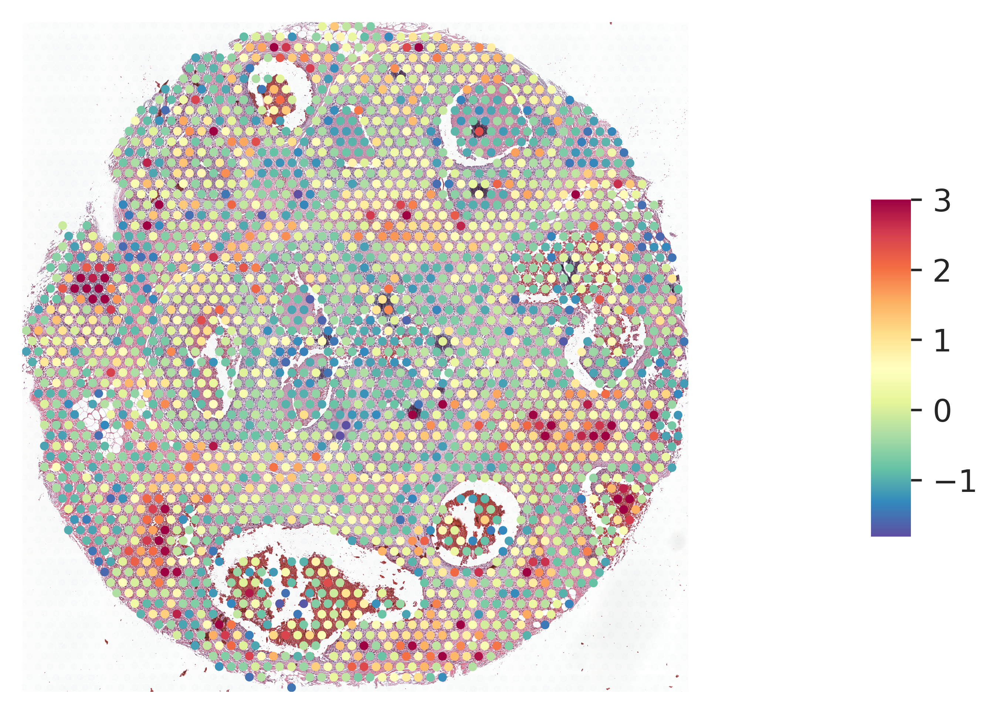

In [110]:
gene_plot(test_dataset_z_, genes="COX6C", spot_size=8, vmin=0, vmax=3)

In [108]:
test_dataset_z_.X

array([[ 9.05935173e-03,  1.21002077e+00,  1.41962843e-01, ...,
        -3.99693214e-01, -5.60264832e-01,  1.54689860e+00],
       [-1.59434459e+00,  3.08023724e-02, -8.33942915e-01, ...,
         1.08999644e-01,  6.23598124e-02, -7.34912998e-01],
       [ 2.78831972e-01, -1.10428895e+00, -1.43556864e+00, ...,
         1.58717701e-01,  9.48087964e-01, -1.62077642e+00],
       ...,
       [ 3.32554801e-02, -3.44727930e-01,  1.56934184e-01, ...,
        -4.10735226e-01, -4.01143008e-01,  6.64602040e-02],
       [ 2.94391622e-01,  1.66963083e+00, -4.50285387e-01, ...,
        -7.13605238e-01,  8.49802640e-05, -7.89531595e-01],
       [ 4.31228710e-01, -8.30924556e-01,  9.87472885e-01, ...,
        -8.02320410e-01, -3.01066869e-01, -1.12904120e+00]])

In [88]:
test_dataset_z = test_dataset.copy()
test_dataset_z.X = zscore(test_dataset_z.X.toarray(), axis=0)

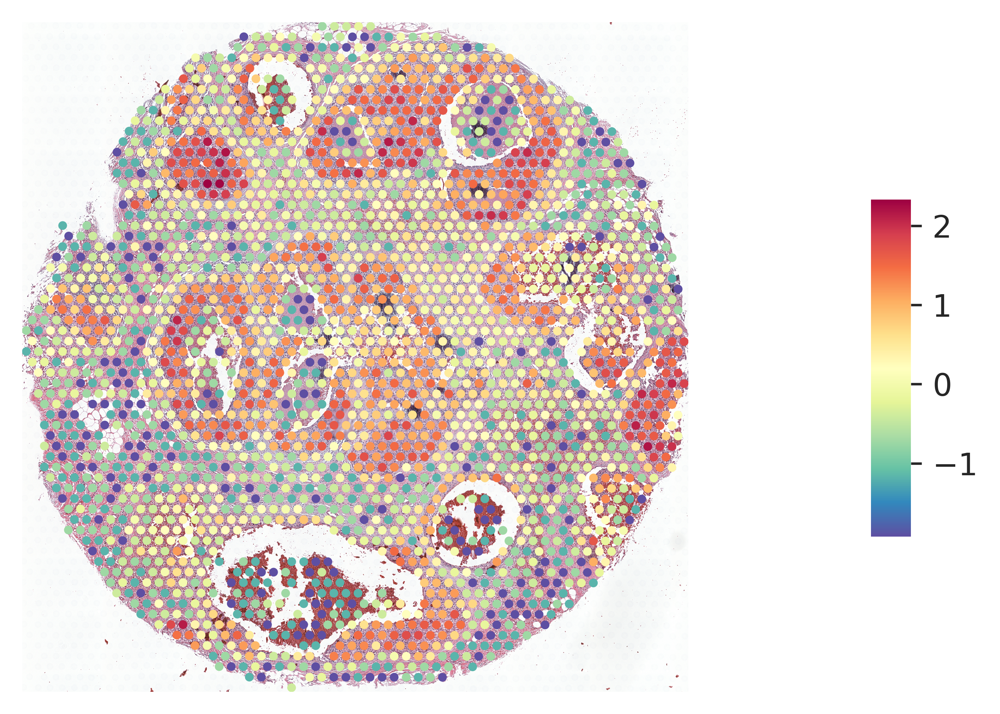

In [89]:
gene_plot(test_dataset_z, genes="COX6C", spot_size=8)

In [25]:
test_dataset_.write("no_norm_pred.h5ad")

In [22]:
no_norm_pred = test_dataset_.copy()

In [ ]:
norm_pred = test_dataset_.copy()

In [33]:
comm_spots = norm_pred.obs_names.intersection(no_norm_pred.obs_names)

In [34]:
test_dataset = test_dataset[comm_spots,:].copy()
no_norm_pred = no_norm_pred[comm_spots,:].copy()
norm_pred = norm_pred[comm_spots,:].copy()

In [35]:
df = pd.DataFrame()
for norm_type, pred_adata in zip(["no_norm_pred", "norm_pred"],[no_norm_pred, norm_pred]):
    for gene in pred_adata.var_names:
        cor_val = calculate_correlation(pred_adata.to_df().loc[:,gene], test_dataset.to_df().loc[:,gene])
        df = df.append(pd.Series([norm_type, gene, cor_val], index=["tile_normal", "gene", "pearson_cor"]),
                  ignore_index=True)

In [36]:
df

,tile_normal,gene,pearson_cor
0,no_norm_pred,COX6C,0.150937
1,no_norm_pred,TTLL12,-0.043182
2,no_norm_pred,PABPC1,0.113699
3,no_norm_pred,GNAS,0.068692
4,no_norm_pred,HSP90AB1,0.042819
5,no_norm_pred,TFF3,0.139196
6,no_norm_pred,ATP1A1,0.231108
7,no_norm_pred,B2M,-0.209696
8,no_norm_pred,FASN,0.096416
9,no_norm_pred,SPARC,-0.185767


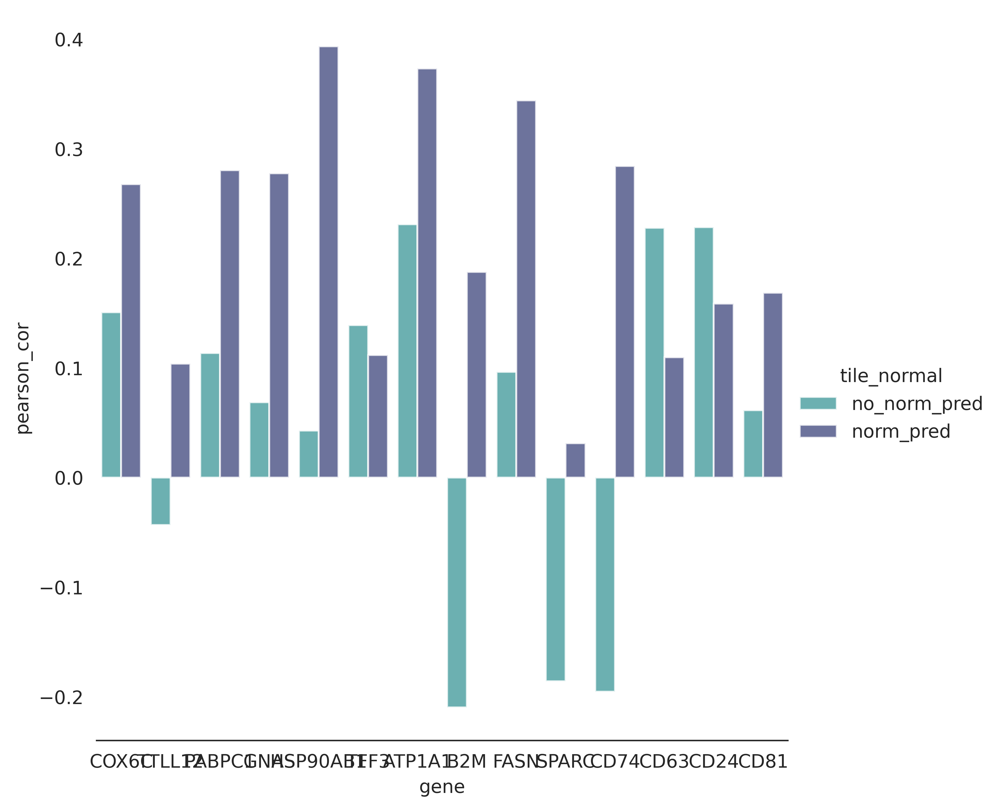

In [37]:
g = sns.catplot(
    data=df, kind="bar",
    x="gene", y="pearson_cor", hue="tile_normal", palette="mako_r", alpha=0.8, height=6,
)
g.despine(left=True)
plt.show()

In [38]:
import matplotlib.pyplot as plt
from libpysal.weights.contiguity import Queen
from libpysal import examples
import numpy as np
import pandas as pd
import geopandas as gpd
import os
import splot
from splot.esda import moran_scatterplot, lisa_cluster
from esda.moran import Moran, Moran_Local
from esda.moran import Moran_BV, Moran_Local_BV
from splot.esda import plot_moran_bv_simulation, plot_moran_bv, plot_local_autocorrelation

In [39]:
df = pd.DataFrame()
for norm_type, pred_adata in zip(["no_norm_pred", "norm_pred"],[no_norm_pred, norm_pred]):
    for gene in pred_adata.var_names:
        test_dataset.obsm["gpd"] = gpd.GeoDataFrame(test_dataset.obs,
                                             geometry=gpd.points_from_xy(
                                                 test_dataset.obs.imagecol,
                                                 test_dataset.obs.imagerow))
        x = test_dataset.to_df()[gene].values
        y = pred_adata.to_df()[gene].values
        w = Queen.from_dataframe(test_dataset.obsm["gpd"])
        moran = Moran(y,w)
        moran_bv = Moran_BV(y, x, w)
        moran_loc = Moran_Local(y, w)
        moran_loc_bv = Moran_Local_BV(y, x, w)
        df = df.append(pd.Series([norm_type, gene, moran_bv.I], index=["tile_normal", "gene", "mora_I"]),
                  ignore_index=True)

In [44]:
128+328+648+68+18+6

1196

In [45]:
3500*5

17500

In [49]:
648*1.10 / 648

1.1

In [50]:
648 / 420

1.542857142857143

In [40]:
df

,tile_normal,gene,mora_I
0,no_norm_pred,COX6C,0.120733
1,no_norm_pred,TTLL12,-0.041177
2,no_norm_pred,PABPC1,0.086729
3,no_norm_pred,GNAS,0.086532
4,no_norm_pred,HSP90AB1,0.068287
5,no_norm_pred,TFF3,0.118536
6,no_norm_pred,ATP1A1,0.194742
7,no_norm_pred,B2M,-0.156950
8,no_norm_pred,FASN,0.067140
9,no_norm_pred,SPARC,-0.117111


In [41]:
import seaborn as sns

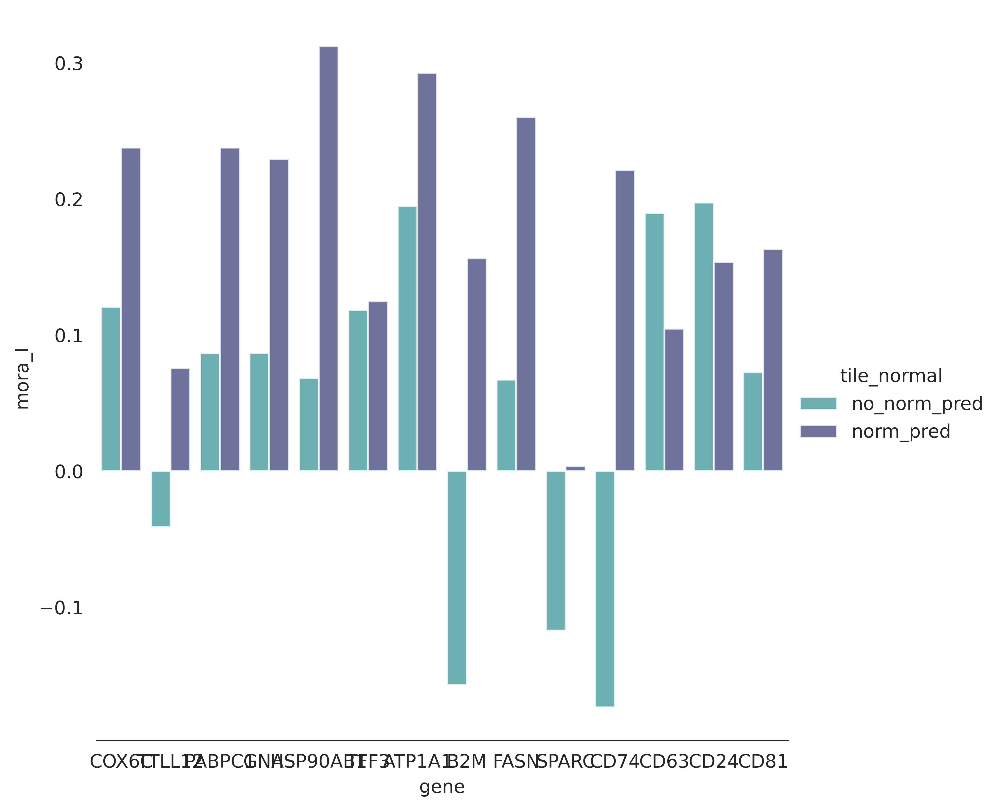

In [42]:
g = sns.catplot(
    data=df, kind="bar",
    x="gene", y="mora_I", hue="tile_normal",  palette="mako_r", alpha=0.8, height=6,
)
g.despine(left=True)
plt.show()